In [0]:
! pip install networkx
! pip install plotly
! pip install colorlover

In [0]:
import pandas as pd
import networkx as nx
from collections import Counter
import nltk
import re

nltk.download('stopwords')
nltk.download('wordnet')
from nltk.corpus import stopwords
stop = stopwords.words('english')
lemmatizer = nltk.WordNetLemmatizer()
stemmer = nltk.stem.porter.PorterStemmer()

import matplotlib.pyplot as plt
import random
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly.graph_objs import *
import plotly.graph_objects as go
init_notebook_mode(connected=True)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


#Q1. Choose a hash-tag
'#iremember' is chosen

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
df = pd.read_csv("/content/drive/My Drive/tweets2009-06-0115.csv.zip", sep='\t', compression='zip')

In [0]:
rawDf = df[df["tweet"].str.lower().str.contains("#iremember", na=False)].copy()
rawDf = rawDf.sample(frac=0.5, replace=True, random_state=42)

In [0]:
# filter out those tweets not mentioning anyone
tagDf = rawDf[rawDf['tweet'].str.contains("@")]
# drop those tweets that @ follows by a space which in most case does not mean mentioning
tagDf = tagDf[~tagDf['tweet'].str.contains("@ ")]

#Q2. Build a Mention Graph

##(a)

In [0]:
def addMentionedColumn(df):
    
    def mentionsList(txt):
        allWords = [word.strip(""" ,.:'\";""").lower() for word in txt.split()]
        allNames = [word.strip("@") for word in allWords if word.startswith("@")]
        uniqueNames = list(set(allNames))
        return allNames
    
    df["mentioned"] = df["tweet"].apply(mentionsList)

In [0]:
addMentionedColumn(tagDf)

In [0]:
tagDf

,date,user,tweet,mentioned
2704910,2009-06-14 05:04:00,missbfabulous,@saundraaa the #iremember is the top trend rig...,[saundraaa]
2409503,2009-06-13 22:47:42,mikachu02,Haaaa! Who u tellin! RT @datboybroadway #ireme...,[datboybroadway]
2484444,2009-06-14 00:28:53,kitlewis,RT @OneHalfMokha: #iremember when I didn't hav...,[onehalfmokha]
2458508,2009-06-13 23:58:47,deauxboi,#iremember wen if u could touch the net n 3rd ...,"[coopwood, jazzysoul]"
2040237,2009-06-13 14:33:09,rashaunwilliams,"RT @freshoneblade: #iremember British Knights,...",[freshoneblade]
...,...,...,...,...
2152438,2009-06-13 17:05:45,lcbitch,@MsAddikted2Fame RT @MsAddikted2Fame #iremembe...,"[msaddikted2fame, msaddikted2fame]"
2181023,2009-06-13 17:41:52,otoole4info,"RT @l0veyou: #iremember dial-up.. ohhh fun. ""b...",[l0veyou]
2195126,2009-06-13 18:00:01,alpha1736,RT @AroundHarlem: Not participating in #iremem...,[aroundharlem]
2809458,2009-06-14 07:52:03,zlogic5,RT @WizeCrack: #iremember when most girls didn...,[wizecrack]


In [0]:
def mentionGraph(df):
    g = nx.Graph()
    
    for (index, date, user, tweet, mentionedUsers) in df.itertuples():
        for mentionedUser in mentionedUsers:
            if (user in g) and (mentionedUser in g[user]):
                g[user][mentionedUser]["numberMentions"] += 1
            else:
                g.add_edge(user, mentionedUser, numberMentions=1)
    
    return g

In [0]:
tagGraph = mentionGraph(tagDf)

In [0]:
print("# nodes:", len(tagGraph.nodes()))
print("# edges:", len(tagGraph.edges()))

# nodes: 3199
# edges: 2531


##(b)

In [0]:
degrees=nx.degree(tagGraph)

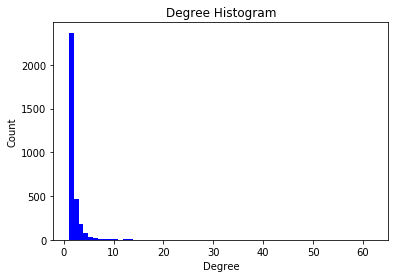

In [0]:
degree_sequence = sorted([d for n, d in tagGraph.degree()], reverse=True)  # degree sequence

# plot histogram
plt.hist(degree_sequence, bins=500, width=1, color='b')

plt.title("Degree Histogram")
plt.ylabel("Count")
plt.xlabel("Degree")


plt.show()

Most of nodes' degree crowed in the left side, in another word, they are most low node degrees. So most of the user only connected (mentioned by) with a few users on twitter.

##(c)

In [0]:
sorted(tagGraph.edges(data=True),key=lambda x: x[2]['numberMentions'],reverse=True)[:5]

[('javilovespizza', 'twitter', {'numberMentions': 16}),
 ('savedbarbie', 'naykidd', {'numberMentions': 10}),
 ('wakkaoaka1337', 'maryfarnsworth', {'numberMentions': 9}),
 ('mileycyrus', 'vonnieee', {'numberMentions': 9}),
 ('chasencashe', 'drunkenrandom', {'numberMentions': 8})]

##(d)

In [0]:
def addRandomPositions(graph):
    posDict = dict((node,(random.gauss(0,10),random.gauss(0,10))) for node in graph.nodes())
    nx.set_node_attributes(graph, name="pos", values=posDict)

addRandomPositions(tagGraph)
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))

In [0]:
import colorlover as cl
from IPython.display import HTML
rdyibu = cl.scales['9']['div']['RdYlBu']
rdyibu300 = cl.interp(rdyibu, 17)
HTML(cl.to_html(rdyibu300))

In [0]:
def plotNetworkWidthColor(graph):
    scatters=[]

    for (node1, node2) in graph.edges():
        x0, y0 = graph.nodes[node1]['pos']
        x1, y1 = graph.nodes[node2]['pos']
        edgeWidth = graph[node1][node2]['numberMentions']
        s = Scatter(
                x=[x0, x1],
                y=[y0, y1],
                hoverinfo='none',
                mode='lines', 
                line=scatter.Line(width=edgeWidth ,color=rdyibu300[edgeWidth]))
        scatters.append(s)



    for node in graph.nodes():
        xPos, yPos = graph.nodes[node]['pos']
        s = Scatter(
                x=[xPos], 
                y=[yPos], 
                hoverinfo='none',
                mode='markers', 
                marker=dict(
                    color="#888", 
                    size=10,         
                    line=dict(width=2)))
        scatters.append(s)
    
    layout = Layout(showlegend=False)
    fig = Figure(data=scatters, layout=layout)
    iplot(fig, show_link=True)

In [0]:
configure_plotly_browser_state()
plotNetworkWidthColor(tagGraph)

#Q3. Content Analysis

In [0]:
def getTopK(df, k, column='tweet'):
    stop = set(stopwords.words('english'))
    #Add possible Stop Words for tweets
    stop.add('RT')
    stop.add('lol')
    stop.add('iremember')
    stop.add('http')
    stop.add('2009')
    stop.add('com')
    stop.add('lmao')
    stop.add('tinyurl')
    stop.add('twitpic')
    stop.add('twitter')
    counter = Counter()
    for tweet in df[column]:
       counter.update([word
                       for word 
                       in re.findall(r'\w+', tweet) 
                       if word.lower() not in stop and len(word) > 2])
    topk = counter.most_common(k)
    return topk

In [0]:
pd.DataFrame(getTopK(tagDf,500)).head(50)

,0,1
0,used,181
1,like,167
2,get,154
3,got,121
4,one,120
5,bit,119
6,remember,114
7,back,109
8,could,108
9,first,107


The hastag #iremember main theme could be looking back to some old times. Some are good and some are sad times, but people generally enjory looking back at those memories. When looking closer to some tweets, some are about the change in status of nowadays that is so different from the past.

There are two user got mentioned very frequently, TheRealJordin and ChaseNCashe. Jordin Spark rose to fame in 2007 after winning the sixth season of American Idol, hence the tweeter account TheRealJordin she was using has a lot of followers and retweets, hence a lot of mentions. Same goes for ChaseNCashe, a rapper.

In [0]:
tagDf[tagDf['tweet'].str.contains('TheRealJordin')]

,date,user,tweet,mentioned
3091525,2009-06-14 16:00:35,chelsyarchuleta,"@TheRealJordin #iremember boy bands, and good ...",[therealjordin]
3080745,2009-06-14 15:45:53,gusherettes,@TheRealJordin #iremember when einnA17 sang NO...,[therealjordin]
3267108,2009-06-14 20:06:45,lavalamplv,RT @TheRealJordin: #Iremember playing Barbies ...,[therealjordin]
3171014,2009-06-14 17:55:27,apclayton,RT @TheRealJordin: #iremember Scholastic order...,[therealjordin]
3263764,2009-06-14 19:59:04,mandaplz,Truth!RT @TheRealJordin #iremember FRUIT STRIP...,[therealjordin]
...,...,...,...,...
2999864,2009-06-14 13:45:54,mercybeltran,RT @TheRealJordin: #iremember MTV being MUSIC ...,[therealjordin]
3080697,2009-06-14 15:45:47,yoshi831,RT @TheRealJordin: #iremember BOP IT! *pssssh*...,[therealjordin]
3139640,2009-06-14 17:10:52,msjerzi,RT @TheRealJordin #iremember When everyone was...,[therealjordin]
3171014,2009-06-14 17:55:27,apclayton,RT @TheRealJordin: #iremember Scholastic order...,[therealjordin]


In [0]:
tagDf[tagDf['tweet'].str.contains('ChaseNCashe')]

,date,user,tweet,mentioned
1784037,2009-06-13 07:20:25,chinichole,RT @lonestarrmuzik: @ChaseNCashe #iRemember po...,"[lonestarrmuzik, chasencashe]"
1817608,2009-06-13 08:09:20,onthajon,@ChaseNCashe #iRemember when jezzy's rap name ...,[chasencashe]
1798326,2009-06-13 07:40:23,drunkenrandom,RT @ChaseNCashe #iRemember when Lil Wayne didn...,[chasencashe]
2737306,2009-06-14 05:48:49,kitlewis,RT @ChaseNCashe: #iRemember hearing the baby i...,[chasencashe]
2493399,2009-06-14 00:40:18,asdavis10,RT @JdotRose: RT @ChaseNCashe #iRemember when ...,"[jdotrose, chasencashe]"
1735108,2009-06-13 05:59:23,drunkenrandom,"RT @ChaseNCashe #IRemember Citas World. |Damn,...",[chasencashe]
3408198,2009-06-14 23:16:52,djfu,RT @ChaseNCashe: #iRemember when I used to kno...,[chasencashe]
2468060,2009-06-14 00:09:12,sincere11,RT: @ChaseNCashe #iRemember when shorties used...,[chasencashe]
1801675,2009-06-13 07:46:28,velmadaria,RT @ChaseNCashe Ok so officially I AM LEGEND. ...,"[chasencashe, chasencashe]"
1745937,2009-06-13 06:15:05,skmusic,RT @ChaseNCashe: #IRemember when they first st...,[chasencashe]


##(b)

In [0]:
def plotNetworkHover(graph):
    
    scatters=[]

    for (node1, node2) in graph.edges():
        x0, y0 = graph.nodes[node1]['pos']
        x1, y1 = graph.nodes[node2]['pos']
        edgeWidth = graph[node1][node2]['numberMentions']
        s = Scatter(
                x=[x0, x1],
                y=[y0, y1],
                text="%s\nand%s\nhave %i\nconnections" % (node1, node2, edgeWidth),
                hoverinfo='text',
                mode='lines', 
                line=scatter.Line(width=edgeWidth ,color=rdyibu300[edgeWidth]))
        scatters.append(s)



    for node in graph.nodes():
        nodeDf=tagDf[tagDf['user']==node]
        
        xPos, yPos = graph.nodes[node]['pos']
        s = Scatter(
                x=[xPos], 
                y=[yPos], 
                text="User: %s\nhas 3 most common words: %s" % (node, getTopK(nodeDf,3)),
                hoverinfo='text',
                mode='markers', 
                marker=dict(
                    color='#888', 
                    size=10,         
                    line=dict(width=2)))
        scatters.append(s)
    
    layout = Layout(showlegend=False)
    fig = Figure(data=scatters, layout=layout)
    iplot(fig, show_link=False)

In [0]:
configure_plotly_browser_state()
plotNetworkHover(tagGraph)

The node with empyty top words are the ones that has been mentioned, but does not have tweets associated with it.

#Q4. Centrality Analysis

##(a)

In [0]:
btwCentr = nx.betweenness_centrality(tagGraph)
maxCentrBtw = max(btwCentr.values())
minCentrBtw = min(btwCentr.values())

closeness = nx.closeness_centrality(tagGraph)
maxCentrCl = max(closeness.values())
minCentrCl = min(closeness.values())

Node degree, Betweeness and Closeness are chosen as the centrality measure in a social network.

Node degree reflects the amount of user it either has mentioned or has been mentioned. It can be associated with the size of the nodes to assist in the other centrality measures.

High betweeness means the node is close to the center of the net and a lot of connections go through that node. In the twitter network, it means the user is close to the center of the chosen hastag of the topic.

Closeness measures the averaged distance of shortest paths from nodes reachable by the objective node and the objective node. In the twitter network, high closeness means the user is closer to all the other connectable user on average.

Pagerank is also a good way to represent the centrality but since the graph we have here is undirected, and pagerank only apply to directed graph, this centrality method is not used.

##(b)

In [0]:
# map color scale to 300 cells
ylgnbu = cl.scales['9']['seq']['YlGnBu']
ylgnbu300 = cl.interp(ylgnbu, 300)
HTML(cl.to_html(ylgnbu300))

In [0]:
def plotNetworkCentr(graph,centrality,maxCentr,minCentr):
    
    
    scatters=[]

    for (node1, node2) in graph.edges():
        x0, y0 = graph.nodes[node1]['pos']
        x1, y1 = graph.nodes[node2]['pos']
        edgeWidth = graph[node1][node2]['numberMentions']
        s = Scatter(
                x=[x0, x1],
                y=[y0, y1],
                hoverinfo='none',
                mode='lines', 
                line=scatter.Line(width=1 ,color='#888'))
        scatters.append(s)



    for node in graph.nodes():
        nodeCentr = centrality[node]
        nodeColor = int(299*(nodeCentr-minCentr)/(maxCentr-minCentr))
        xPos, yPos = graph.nodes[node]['pos']
        s = Scatter(
                x=[xPos], 
                y=[yPos], 
                text="User: %s\nCentrality: %.3f" % (node, nodeCentr*100),
                hoverinfo='text',
                mode='markers', 
                marker=dict(
                    color=ylgnbu300[nodeColor], 
                    size=nx.degree(graph,node),         
                    line=dict(width=2)))
        scatters.append(s)
    
    layout = Layout(showlegend=False)
    fig = Figure(data=scatters, layout=layout)
    iplot(fig, show_link=False)

In [0]:
configure_plotly_browser_state()
plotNetworkCentr(tagGraph, btwCentr, maxCentrBtw, minCentrBtw)

In [0]:
configure_plotly_browser_state()
plotNetworkCentr(tagGraph, closeness, maxCentrCl, minCentrCl)

##(c)

1. Are the results similar or different? Explain what can be the reason for the observed similarity or difference.
2. What centrality measure produced a more meaningful interpretation? Why?

The two similarity measure return a much different result. However, the node chasenchase have the highest centrality in both measure. 

In betweeness centrality, most of the nodes have low centrality rank, which indictes most of the nodes have a relatively direct link towards each other, so they do not need to go through others to connect with each other. 

In closeness centrality, a large amount of nodes have high closeness, which means they are very close to their connected nodes and form little tribes.

The reason for the different is how the centrality is measured here, as mentioned in (a), betweeness measures how many shortest paths in the GRAPH go through the targeted nodes, while the closeness measures how close the targeted node connected with the nodes it CAN CONNECTED WITH and decreases as the distance(number of nodes) it has to go through. In another words, because it is highly unlikely a node can connected with all the rest of the nodes with very short distance, the closeness calculate centrality of each node based on a subgraph, beacuse the rest are penalized close to zero due to long distance, instead of the whlole graph like betweeness.

-------------------------------

The result of betweeness bears more meaningful interpretation in this situation as it high betweeness means a lot of the connections in graph go through it and without the node, most of the connection in the social network will break. But with closeness, an outlier cluster of nodes can produce very high closeness nodes but they are not that important to the social network.

-----------------------------------

One thing to be noticed here is the node therealjordin, which has the largest node degree but very low betweeness, hence the users connected with her are well connected with each other.

#Q5. Connectivity Patterns

##(a)

In [0]:
# Number of maximal cliques for each node
clique = nx.number_of_cliques(tagGraph)
maximalCl = pd.DataFrame(clique.items())
maximalCl.columns=['User', 'MaximalCliques']
maximalCl.sort_values(by=['MaximalCliques'], ascending=False)

,User,MaximalCliques
40,therealjordin,60
104,chasencashe,35
759,shyla,25
1985,maxofs2d,23
1821,yungcmusic,19
...,...,...
1354,naykidd,1
1356,kdeezy90,1
1357,shawny08,1
1358,sandrinecharles,1


In [0]:
# Number of maximal cliques
sum(maximalCl['MaximalCliques'])

4790

In [0]:
# The graph's clique number
nx.graph_clique_number(tagGraph)

3

In [0]:
# Size of the largest maximal clique containing each given node.
ccn = nx.cliques_containing_node(tagGraph)
ccnDf = pd.DataFrame.from_dict(ccn, orient='index')

In [51]:
for index, row in ccnDf.iterrows():
  ccnDf.loc[index, 'largestMaximalClique'] = row.str.len().max()
maxClDf = pd.DataFrame(ccnDf['largestMaximalClique'].copy())
maxClDf.sort_values(by=['largestMaximalClique'], ascending=False).head(50)

,largestMaximalClique
fetti,3.0
rebeccamezzino,3.0
mstoshay,3.0
nessalewinski,3.0
twitter,3.0
javilovespizza,3.0
msbond2u,3.0
mrpeteywheat,3.0
funwugirl,3.0
threedukes,3.0


In [69]:
len(maxClDf[maxClDf['largestMaximalClique']==3])/len(maxClDf)

0.030634573304157548

##(b)

The largest clique has the size of 3 and there are a lot of them. So the situation that a large group of users that all connected with each other does not happen. 

There are 4790 maximal cliques in the graph with largest to be size of 3, it means all of the maximal cliques are small. Since the smallest clique is size of 2 and the network is constructed undirected with mentions, with about 97% of maximal cliques are size of 2, it is safe to say that most of the users do not know or interact with most of the users in the network.

The number of maximal clique of each node is also informative as most of cliques has size of 2 and it can tell us that those users with high number of  maximal clique are famous, because they have been mentioned by many different users.